# **Cell nuclei detection by Stardist**
---

Welcome to run and learn about deep-learning and object detection! **Stardist** is object detection deep-learning method to detect cell nucleis in single and stack images. 

**The method and original code is based on following papers:**

[Cell Detection with Star-convex Polygons](https://arxiv.org/abs/1806.03535)

Uwe Schmidt, Martin Weigert, Coleman Broaddus, and Gene Myers.
International Conference on Medical Image Computing and Computer-Assisted Intervention (MICCAI), Granada, Spain, September 2018.

[Star-convex Polyhedra for 3D Object Detection and Segmentation in Microscopy](https://arxiv.org/abs/1908.03636)

Martin Weigert, Uwe Schmidt, Robert Haase, Ko Sugawara, and Gene Myers. arXiv, 2019

**The Original code** is freely available in GitHub:
https://github.com/mpicbg-csbd/stardist

This notebook and workflow is combined and created by Johanna Jukkala (jjukkala@abo.fi) and supervised by PI Guillaume Jacquemet https://cellmig.org/ 



# **How to use this notebook?**
---


On the left side you see **Table of contents, Code snippets** and **Files**.

**Table of contents** = contains this table of contents of this notebook. Click the content to move quickly.

**Code snippets** = contain examples how to code certain tasks. You do not need this section to use this notebook.

**Files** = contains all available files. You can **upload** here your files and **connect your Google Drive** (see section 5.1). **Remember that all uploaded files will be gone after changing the runtime (see section 1) or you exit this notebook.** All files saved in Google Drive will remain. Do not use Mount Drive-button; your Google Drive is connected in section 5.1.


Other note: "sample data" is default file. Do not upload anything here! 

---
This notebook contain **cells** which can contain ether text or code. 

**Text cell** provide information and can be modified by douple-clicking the cell. You are currently reading the text cell. You can create a new text by clicking `+ Text`.

**Coding cell** contains code and the code can be modfied by selecting the cell. To execute the cell, move your cursor on the `[ ]`-mark on the left side of the cell (play button appear). Click to execute the cell. After execution is done the animation of play button stops. You can create a new coding cell by clicking `+ Code`.

**If you make any changes to coding cell**, please make a new copy of the notebook into your Google Drive. Also, it is advisable to use `#`-mark in cell. Mark allows you to keep the original code piece in cell.
For example:

Original code: all lines are excuted

`my_files = 2`

`my_mask = "names of masks"`

Modified code: the 1st line is not executed, but the 2nd and 3rd line are.

`#my_files = 2`

`my_files = 200`

`my_mask = "names of masks"`





# **The commong workflow**

---
**If you wish to train network and test single images:**

Go sections: 1-5 (setup) 6-7 (training) and 8 (prediction)

**If you wish to train network and test stack images or videos:**

Go sections: 1-5 (setup) 6-7 (training) and 9 (prediction)

**If you have already trained network and test images:**

Go sections: 1-5 (setup) and 8 (prediction, single images) or 9 (prediction, stack images)

---


# **1. Create a folder tree into Google Drive**
---
1. Create a following folder tree in your Google Drive:

*   Experiment_A1
    - test
      - test_dataset
      - test_batch
    - train
      - images
      - masks
      - ROIsets
      - trained_model
    - results

2. Place a copy of all your own dataset(single images or stack images) in **test_dataset** -folder. Use only tif-files!
3. If you test stack images place also a copy of all your own dataset(stack images, videos) in **test_batch** -folder. Use only tif-files!
3. Place all your training images in the **images** folder.
4. Place all your mask images in the **masks** folder
5. Place all ROIsets of mask images in **ROIsets** folder. This folder is not needed in order to but is is advisable to save ROIsets in to same folder is you wish to modify your training dataset later.
5. Check that your each training images and corresponding mask image have the same file-name. Otherwise Stardist does not regonize them.
6. **Trained_model** folder will contain files of parameters of trained network.
7. **Results** - folder will contain resulting ROIS and images. Your original images remain in test-folder and unmodified.
---


# **2. Set the Runtime type**
---

Go to **Runtime -> Change the Runtime type** and select:

**Runtime type: Python 3** (Python 3 is programming language in which this program is written)

**Accelator: GPU** (Graphics processing unit (GPU) is accelarates the processing of graphic images. Without GPU the processing would take longer time)




# **3. Enable Tensorflow 1**

---

Tensorflow is open-source library, which enables the use of deep-learning programs. For now, Stardist uses Tensorflow version 1.

**What to do:** Move your cursor on the `[  ]` mark below. A play-button appear. Click button to start. When operation is ready the animation of play button stops.

In [0]:
#@markdown Play the cell to enable Tensorflow 1

%tensorflow_version 1.x
import tensorflow
print(tensorflow.__version__)
print("Tensorflow enabled.")

1.15.0
Tensorflow enabled.


# **4. Setup Stardist**

---

**Install and import libraries and packages to run Stardist.** Packages and libraries contain spesific operations, functions and tools which allows user to run specific operations. 

In [0]:
#@markdown Play the cell to install all libraries.
# Install packages which are not included in Google Colab

!pip install tifffile # contains tools to operate tiff-files
!pip install csbdeep  # contains tools for restoration of fluorescence microcopy images (Content-aware Image Restoration, CARE). It uses Keras and Tensorflow.
!pip install stardist # contains tools to operate STARDIST.

# Import libraries needed to perform notebook
from __future__ import print_function, unicode_literals, absolute_import, division
import sys
from pathlib import Path
import os
import numpy as np # collection of matematical operations
import matplotlib.pyplot as plt # tools for creating figures and plots
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
from glob import glob # program can read path names 
from tqdm import tqdm # imports tools to create progress meter
from tifffile import imread # program can open and read tiff-files
from csbdeep.utils import Path, normalize, download_and_extract_zip_file, plot_history # for loss plot
from csbdeep.io import save_tiff_imagej_compatible

# import stardist
from stardist import fill_label_holes, random_label_cmap, calculate_extents, gputools_available, relabel_image_stardist, random_label_cmap,  relabel_image_stardist, _draw_polygons, export_imagej_rois
from stardist.models import Config2D, StarDist2D, StarDistData2D # import objects
from stardist.matching import matching_dataset
np.random.seed(42)
lbl_cmap = random_label_cmap()

!pip install memory_profiler
%load_ext memory_profiler

The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler


# **5. Upload the data**

**5.1 Connect to Google Drive**
---
Here we mount your Google Drive in Google Colab. 

In [0]:
#@markdown Play the cell to mount your Google Drive account.

#@markdown * Click on the URL. 

#@markdown * Sign in with your Google credentials. 

#@markdown * Copy and paste the authorization code here (looks like: 4/tgHBJgCHUe30...). 

#@markdown * Click on the "Files" tab located on the right of the google colab interface. 

#@markdown * Click on "Refresh". 

#@markdown * Your Drive should now be visible under "drive".

from google.colab import drive # imports the package and tool which connects your Google Drive to Google colab 
drive.mount('/content/drive') # path were Drive will be connected

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**5.2 Download training data from other location (optional)**
---
If your training dataset is elsewhere than Google Drive, you can download it from here. For example, if you need to download zipped file from GitHub.
Also, **if you like to use the ORIGINAL TRAINING DATASET of Stardist (Schmidt et. all, Weigert et all. articles)**, you can download it in this section.

Please note that the downloaded dataset is not in your folder tree but in "data" folder (see the "Files" on the left after playing the cell).


In [0]:
download_and_extract_zip_file(
    url       = 'https://github.com/mpicbg-csbd/stardist/releases/download/0.1.0/dsb2018.zip',
    targetdir = 'data',
    verbose   = 1,
) 

Files missing, downloading... extracting... done.


**5.3 Set the parameters and operating folders**
---

**What to do:** Enter the following paths and parameters. Copy the reguired path from the left from "Files" (right-click) to form right side of the cell. DO NOT TOUCH THE CODE! **Finally, play the cell to load information to the Stardist**.

**`prediction`:** Enter path of the folder containing your training images.

**`results`:** Enter a path for your results.

**`training`:** Enter path of the folder containing your training images. If you already have trained networks, leave this untouched (Stardist uses pretrained model).

**`masks`:** Enter path of the folder containing your mask images. If you already have trained networks, leave this untouched (Stardist uses pretrained model).

**`epochs`:** Input number of epochs in the networks. Original Stardist network is trained wth 400 epochs. If you already have trained networks, leave this untouched (Stardist uses pretrained model).

**`steps`:** Input number of steps in each epoch. Original Stardist network is trained with 100 steps. If you already have trained networks, leave this untouched (Stardist uses pretrained model).

**`modelpath`:** Enter path of the folder containing your model to-be-trained or pretrained model. All pretrained and will-be trained models are here (see Section 1). 

**`name`:** Name of you model. Use only my_model -style, not my-model.  If you already have trained networks, enter the name of the pretrained model (the name of the folder which is in trained_model -folder, includes all files of pretrained networks).

In [0]:
#@markdown Path to the prediction images and results folder:
prediction = "/content/drive/My Drive/Zero-Cost Deep-Learning to Enhance Microscopy/Notebooks to be tested/Stardist/Experiment_A1/prediction/test_singles" #@param {type:"string"}
test_dataset = prediction
#test_batch = "/content/drive/Shared drives/Jacquemet Lab/Lab Projects/Zero Cost AI/Dataset/Nuclei pictures Others" #@param {type:"string"}

results = "/content/drive/My Drive/Zero-Cost Deep-Learning to Enhance Microscopy/Notebooks to be tested/Stardist/Experiment_A1/results" #@param {type:"string"}

#@markdown Training parameters and path to the training and masked images:
training = "/content/drive/My Drive/Zero-Cost Deep-Learning to Enhance Microscopy/Notebooks to be tested/Stardist/Experiment_A1/train/images" #@param {type:"string"}
training_images = training
masks = "/content/drive/My Drive/Zero-Cost Deep-Learning to Enhance Microscopy/Notebooks to be tested/Stardist/Experiment_A1/train/masks" #@param {type:"string"}
mask_images = masks 
epochs = 400 #@param {type:"number"}
input_epochs = epochs
steps = 100 #@param {type:"number"}
input_steps = steps
modelname = "50s_100e_GPU_JJ" #@param {type:"string"}
model_name = modelname
modelpath = "/content/drive/My Drive/Zero-Cost Deep-Learning to Enhance Microscopy/Notebooks to be tested/Stardist/Experiment_A1/results" #@param {type:"string"}
trained_model = modelpath 

# Here we add "/*.tif" script to the end of the path
# -> funtion "glob" (in 5.3) regonzises all tiff-files
# in that folder

# training
training_images=training_images+"/*.tif"
mask_images=mask_images+"/*.tif"
#single images
testDATA = test_dataset
test_dataset=test_dataset+"/*.tif"
#stack images
#test_batch_path=test_batch
#test_batch=test_batch+"/*.tif"



# **6. Preparing the training data for network**
---
In this section we prepare your training data for the network.


**6.1 Preparing training dataset**
---

In this section we prepare you training data for the network.

Trouple-shooting: The cell below check the path names are correct. If not, it raise an error. Possible solutions: Check that folder path is correct.


In [0]:
#@markdown Play the cell to prepare the training dataset (images and masks).
# this funtion imports training images and masks and sorts them suitable for the network
X = sorted(glob(training_images))   
Y = sorted(glob(mask_images))   

# assert -funtion check that X and Y really have images. If not this cell raises an error
assert all(Path(x).name==Path(y).name for x,y in zip(X,Y))
!cat /proc/meminfo | grep 'MemAvailable'

MemAvailable:   11392932 kB


**6.2 Map images**
---
Here we map the training dataset (images and masks).



In [0]:
#@markdown Play the cell to map the training dataset (images and masks).
X = list(map(imread,X))
Y = list(map(imread,Y))
n_channel = 1 if X[0].ndim == 2 else X[0].shape[-1]

**6.3 Normalize images**
---
Normalize images and fill small label holes.

In [0]:
#@markdown Play the cell to normalize the training dataset (images and masks).
axis_norm = (0,1)   # normalize channels independently
# axis_norm = (0,1,2) # normalize channels jointly
if n_channel > 1:
    print("Normalizing image channels %s." % ('jointly' if axis_norm is None or 2 in axis_norm else 'independently'))
    sys.stdout.flush()

X = [normalize(x,1,99.8,axis=axis_norm) for x in tqdm(X)]
Y = [fill_label_holes(y) for y in tqdm(Y)]

100%|██████████| 30/30 [00:00<00:00, 30.44it/s]


**6.4 Split the training dataset**
---
Here we split the your training dataset into training images (90 %) and validation images (10 %). 

It is advisable to use 10 % of your training dataset for validation. This ensures the truthfull validation error value. If only few validation images are used network may choose too easy or too challenging images for validation. 

In [0]:
#@markdown Play the cell to split training data (images and masks) into training images and validation images.
assert len(X) > 1, "not enough training data"
rng = np.random.RandomState(42)
ind = rng.permutation(len(X))
n_val = max(1, int(round(0.15 * len(ind))))
ind_train, ind_val = ind[:-n_val], ind[-n_val:]
X_val, Y_val = [X[i] for i in ind_val]  , [Y[i] for i in ind_val]
X_trn, Y_trn = [X[i] for i in ind_train], [Y[i] for i in ind_train] 
print('number of images: %3d' % len(X))
print('- training:       %3d' % len(X_trn))
print('- validation:     %3d' % len(X_val))


%memit 


number of images:  30
- training:        26
- validation:       4
MemAvailable:   11394188 kB
peak memory: 2607.84 MiB, increment: 0.00 MiB


**6.5 Example images**
---
Training data consists of pairs of input image and label instances.

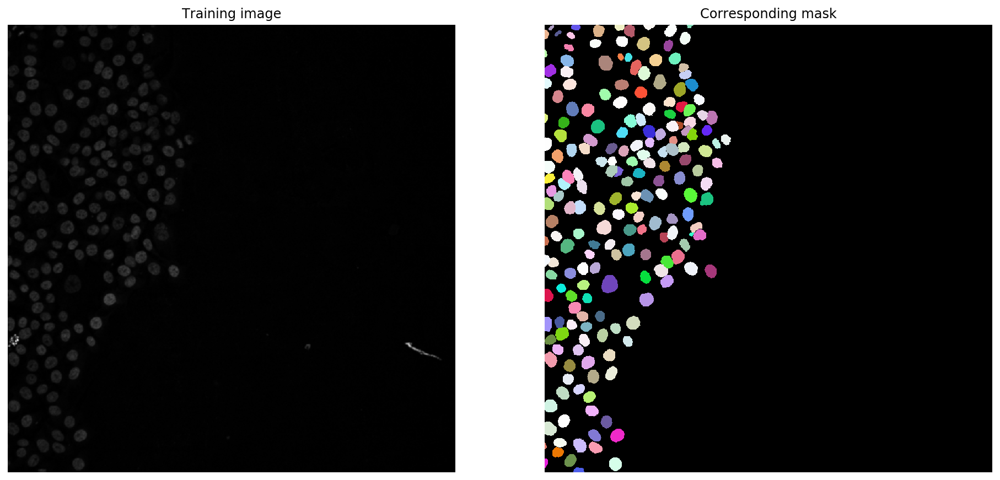

In [0]:
#@markdown Play the cell to show sample of training images and masks.
i = min(9, len(X)-1)
img, lbl = X[i], Y[i]
assert img.ndim in (2,3)
img = img if img.ndim==2 else img[...,:3]
plt.figure(figsize=(16,10))
plt.subplot(121); plt.imshow(img,cmap='gray');   plt.axis('off'); plt.title('Training image')
plt.subplot(122); plt.imshow(lbl,cmap=lbl_cmap); plt.axis('off'); plt.title('Corresponding mask')
None;

**6.6 Stardist model**
---

A `StarDist2D` model is specified via a `Config2D` object.


In [0]:
#@markdown Play the cell to show configuration for Stardist model.
print(Config2D.__doc__)

Configuration for a :class:`StarDist2D` model.

    Parameters
    ----------
    axes : str or None
        Axes of the input images.
    n_rays : int
        Number of radial directions for the star-convex polygon.
        Recommended to use a power of 2 (default: 32).
    n_channel_in : int
        Number of channels of given input image (default: 1).
    grid : (int,int)
        Subsampling factors (must be powers of 2) for each of the axes.
        Model will predict on a subsampled grid for increased efficiency and larger field of view.
    backbone : str
        Name of the neural network architecture to be used as backbone.
    kwargs : dict
        Overwrite (or add) configuration attributes (see below).


    Attributes
    ----------
    unet_n_depth : int
        Number of U-Net resolution levels (down/up-sampling layers).
    unet_kernel_size : (int,int)
        Convolution kernel size for all (U-Net) convolution layers.
    unet_n_filter_base : int
        Number of convo

**6.7 Set number of rays for Stardist**
---
Set number of rays (corners) used for Stardist (like square has 4 corners). 32 is a good default.


In [0]:
#@markdown Play to cell to set number of rays for Stardist. If you wish to change the value, please douple-click this text and change value in `Stardin_rays = 32` to desirable.
# 32 is a good default choice
n_rays = 32

# Use OpenCL-based computations for data generator during training (requires 'gputools')
use_gpu = False and gputools_available()

# Predict on subsampled grid for increased efficiency and larger field of view
grid = (2,2)

conf = Config2D (
    n_rays       = n_rays,
    grid         = grid,
    use_gpu      = use_gpu,
    n_channel_in = n_channel,
)
print(conf)
vars(conf)

Config2D(axes='YXC', backbone='unet', grid=(2, 2), n_channel_in=1, n_channel_out=33, n_dim=2, n_rays=32, net_conv_after_unet=128, net_input_shape=(None, None, 1), net_mask_shape=(None, None, 1), train_background_reg=0.0001, train_batch_size=4, train_checkpoint='weights_best.h5', train_checkpoint_epoch='weights_now.h5', train_checkpoint_last='weights_last.h5', train_completion_crop=32, train_dist_loss='mae', train_epochs=400, train_foreground_only=0.9, train_learning_rate=0.0003, train_loss_weights=(1, 0.2), train_n_val_patches=None, train_patch_size=(256, 256), train_reduce_lr={'factor': 0.5, 'patience': 40, 'min_delta': 0}, train_shape_completion=False, train_steps_per_epoch=100, train_tensorboard=True, unet_activation='relu', unet_batch_norm=False, unet_dropout=0.0, unet_kernel_size=(3, 3), unet_last_activation='relu', unet_n_conv_per_depth=2, unet_n_depth=3, unet_n_filter_base=32, unet_pool=(2, 2), unet_prefix='', use_gpu=False)


{'axes': 'YXC',
 'backbone': 'unet',
 'grid': (2, 2),
 'n_channel_in': 1,
 'n_channel_out': 33,
 'n_dim': 2,
 'n_rays': 32,
 'net_conv_after_unet': 128,
 'net_input_shape': (None, None, 1),
 'net_mask_shape': (None, None, 1),
 'train_background_reg': 0.0001,
 'train_batch_size': 4,
 'train_checkpoint': 'weights_best.h5',
 'train_checkpoint_epoch': 'weights_now.h5',
 'train_checkpoint_last': 'weights_last.h5',
 'train_completion_crop': 32,
 'train_dist_loss': 'mae',
 'train_epochs': 400,
 'train_foreground_only': 0.9,
 'train_learning_rate': 0.0003,
 'train_loss_weights': (1, 0.2),
 'train_n_val_patches': None,
 'train_patch_size': (256, 256),
 'train_reduce_lr': {'factor': 0.5, 'min_delta': 0, 'patience': 40},
 'train_shape_completion': False,
 'train_steps_per_epoch': 100,
 'train_tensorboard': True,
 'unet_activation': 'relu',
 'unet_batch_norm': False,
 'unet_dropout': 0.0,
 'unet_kernel_size': (3, 3),
 'unet_last_activation': 'relu',
 'unet_n_conv_per_depth': 2,
 'unet_n_depth': 3,

**6.8 Adjust the GPU power**
---
When using GPU, it is advisable to spare some GPU memory used for Tensorflow to other platforms in order to perform calculations. **If you wish to use all GPU memory for Tensorflow DO NOT run the cell below.**


In [0]:
#@markdown Play the cell to adjust GPU power.
if use_gpu:
    from csbdeep.utils.tf import limit_gpu_memory
    # adjust as necessary: limit GPU memory to be used by TensorFlow to leave some to OpenCL-based computations
    limit_gpu_memory(0.8)

**6.9 Set the model**
---
Here Stardist creates the path and name for your model.

**Note:** The trained StarDist2D model will not predict completed shapes for partially visible objects at the image boundary if train_shape_completion=False (which is the default option).

In [0]:
#@markdown Play the cell to create model according to section 5.3.
model = StarDist2D(conf, name=model_name, basedir=trained_model)
!cat /proc/meminfo | grep 'MemAvailable'

/usr/local/lib/python3.6/dist-packages/csbdeep/models/base_model.py:134: UserWarning: output path for model already exists, files may be overwritten: /content/drive/My Drive/Zero-Cost Deep-Learning to Enhance Microscopy/Notebooks to be tested/Stardist/Experiment_A1/results/50s_100e_GPU_JJ
  warnings.warn('output path for model already exists, files may be overwritten: %s' % str(self.logdir.resolve()))


Using default values: prob_thresh=0.5, nms_thresh=0.4.
MemAvailable:   11739560 kB


**6.10 Check field of view of the networks**
---
Check if the neural network has a large enough field of view to see up to the boundary of most objects.

In [0]:
#@markdown Play the cell to check view of network.
median_size = calculate_extents(list(Y), np.median)
fov = np.array(model._axes_tile_overlap('YX'))
if any(median_size > fov):
    print("WARNING: median object size larger than field of view of the neural network.")


# **7 Training the network**
---
In this section we train the network


**7.1 Training the network**
---
In this section we start the training of network.

You see results for every epoch (round). You can estimate the training time by following equation: t(training) = ( t(s)/epoch x epochs)/60. For example: 

t(training) = (16 s/epoch x 400 epochs)/60 = 106,7 min

**CRITICAL NOTE: Google Colab has time limit for processing (to prevent using GPU power for datamining). Training time must be less than 12 hours!**

In [0]:
#@markdown Play the cell to start network training.
augmenter = None

# def augmenter(X_batch, Y_batch):
#     """Augmentation for data batch.
#     X_batch is a list of input images (length at most batch_size)
#     Y_batch is the corresponding list of ground-truth label images
#     """
#     # ...
#     return X_batch, Y_batch

# Training the model. 
# 'input_epochs' and 'steps' refers to your input data in section 5.1 
history = model.train(X_trn, Y_trn, validation_data=(X_val,Y_val), augmenter=augmenter,
                      epochs=input_epochs, steps_per_epoch=input_steps)
None;

Epoch 1/400
100/100 [==============================] - 261s 3s/step - loss: 1.7291 - prob_loss: 0.3326 - dist_loss: 6.9827 - prob_kld: 0.2433 - dist_relevant_mae: 6.9820 - dist_relevant_mse: 79.0379 - val_loss: 1.3093 - val_prob_loss: 0.1667 - val_dist_loss: 5.7128 - val_prob_kld: 0.1183 - val_dist_relevant_mae: 5.7119 - val_dist_relevant_mse: 53.2271
Epoch 2/400
100/100 [==============================] - 258s 3s/step - loss: 1.2092 - prob_loss: 0.2314 - dist_loss: 4.8893 - prob_kld: 0.1440 - dist_relevant_mae: 4.8882 - dist_relevant_mse: 38.0543 - val_loss: 1.1585 - val_prob_loss: 0.1492 - val_dist_loss: 5.0466 - val_prob_kld: 0.1007 - val_dist_relevant_mae: 5.0453 - val_dist_relevant_mse: 40.4152
Epoch 3/400
100/100 [==============================] - 256s 3s/step - loss: 1.1552 - prob_loss: 0.2158 - dist_loss: 4.6967 - prob_kld: 0.1287 - dist_relevant_mae: 4.6955 - dist_relevant_mse: 35.4839 - val_loss: 1.0637 - val_prob_loss: 0.1166 - val_dist_loss: 4.7356 - val_prob_kld: 0.0681 - v

KeyboardInterrupt: ignored

**7.2 Estimating training**
---
After training is done, lets plot training and validation loss. 

**What to do:**

Run the cell below. If you like to see different error values in figure, replace the valuenames (see the cell below). To copy the figure, open the image in new window and save it (right-click, save the image).

The error values are saved as test.csv into results folder (refresh the Files if needed). All values are also saved into you model.

['dist_loss', 'dist_relevant_mae', 'dist_relevant_mse', 'loss', 'lr', 'prob_kld', 'prob_loss', 'val_dist_loss', 'val_dist_relevant_mae', 'val_dist_relevant_mse', 'val_loss', 'val_prob_kld', 'val_prob_loss']


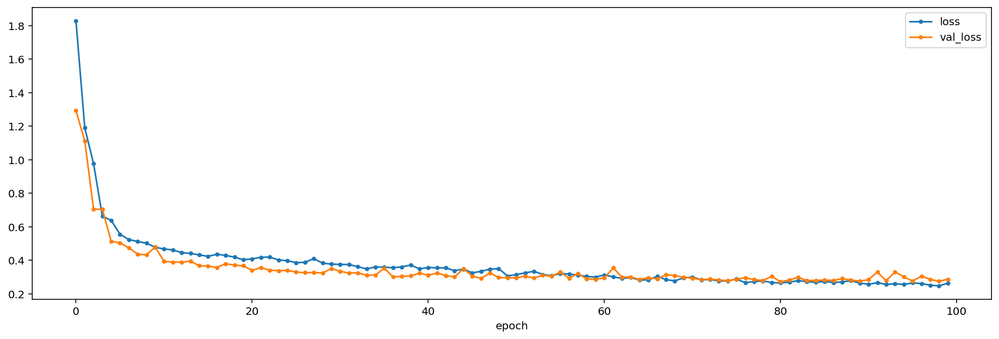

In [0]:
#@markdown Play the cell to create figure and save the result.

#@markdown * If you like to see different error values in figure, replace the valuenames (douple-click this text to reveal to code). 

#@markdown * To copy the figure, open the image in new window and save it (right-click, save the image).

import pandas as pd
import csv

# Sorts the results and prints headlines
print(sorted(list(history.history.keys())))

# Create figure framesize
errorfigure = plt.figure(figsize=(16,5))

# Choose the values you wish to compare. 
# For example, If you wish to see another values, just replace 'loss' to 'dist_loss'
plot_history(history,['loss','val_loss']); 

# convert the history.history dict to a pandas DataFrame:     
hist_df = pd.DataFrame(history.history) 

# The figure is saved into content/ as test.csv (refresh the Files if needed). 
RESULTS = results+'/test.csv'
with open(RESULTS, 'w') as f:
    for key in hist_df.keys():
        f.write("%s,%s\n"%(key,hist_df[key]))




**7.3 NMS Threshold optimization**
---
Here we optimaze non-maximum suppression (NMS).

The optimized values are saved into you model folder (see section 5.1) as  thresholds.json-file.

In [0]:
#@markdown Play the cell to optimize the network.
model.optimize_thresholds(X_val, Y_val)

NMS threshold = 0.5:  75%|███████▌  | 15/20 [00:13<00:06,  1.21s/it, 0.532 -> 0.942]


Using optimized values: prob_thresh=0.503505, nms_thresh=0.4.
Saving to 'thresholds.json'.


{'nms': 0.4, 'prob': 0.5035051936629786}

# **8. Prediction of single images**
---
In this section we use the trained network on your test data.


**8.1 Load and normalize the test data**
---


In [0]:
#@markdown Play the cell to download the data and normalize it.
np.random.seed(16)
lbl_cmap = random_label_cmap()

X = sorted(glob(test_dataset))
X = list(map(imread,X))

n_channel = 1 if X[0].ndim == 2 else X[0].shape[-1]
axis_norm = (0,1)   # normalize channels independently
# axis_norm = (0,1,2) # normalize channels jointly
if n_channel > 1:
    print("Normalizing image channels %s." % ('jointly' if axis_norm is None or 2 in axis_norm else 'independently'))

**8.2 Load the model (trained network)**
---

If you trained your own StarDist model (and optimized its thresholds).

In [0]:
#@markdown Play the cell to load your pretrained model.
model = StarDist2D(None, name=model_name, basedir=trained_model)

Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.503505, nms_thresh=0.4.


**8.3 Prediction**
---


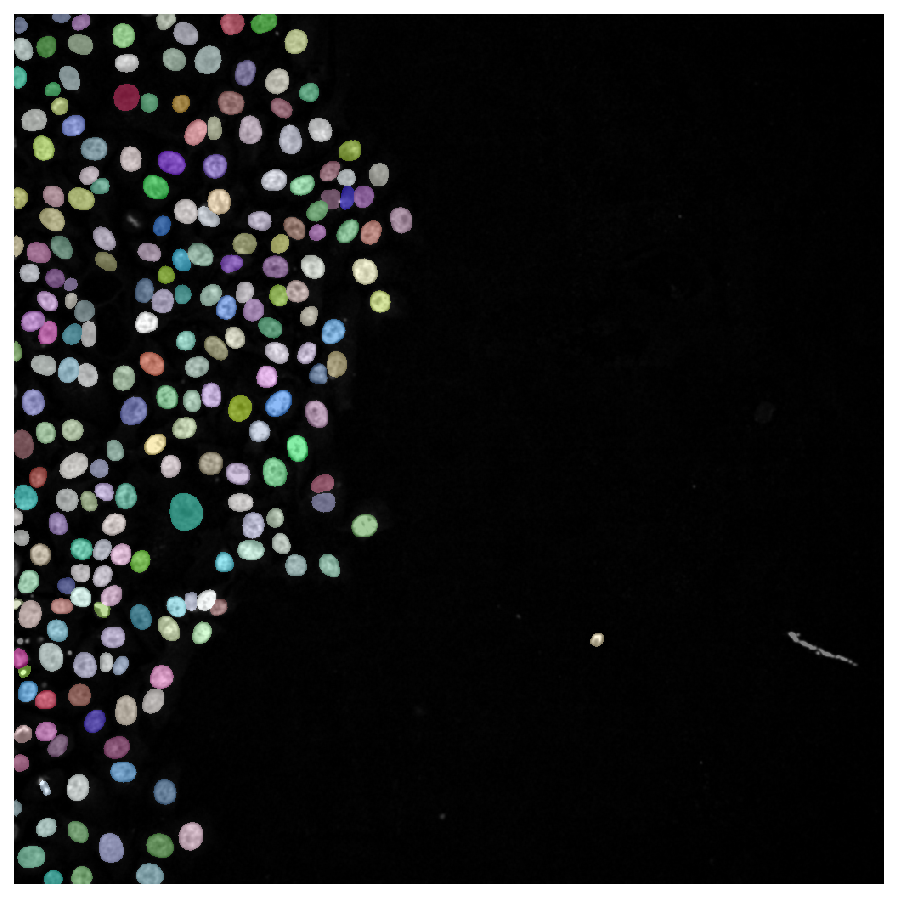

In [0]:
#@markdown Play the cell to see preview of prediction image.
my_images = len(X)-1
img = normalize(X[my_images], 1,99.8, axis=axis_norm)
labels, details = model.predict_instances(img)

plt.figure(figsize=(8,8))
plt.imshow(img if img.ndim==2 else img[...,:3], clim=(0,1), cmap='gray')
plt.imshow(labels, cmap=lbl_cmap, alpha=0.5)
plt.axis('off');


**8.3 Results**
---


Module called `example` is defined. This "miniprogram" creates figure for the results.

In [0]:
#@markdown Play the cell to create module.
def example(model, i, show_dist=True):
    img = normalize(X[i], 1,99.8, axis=axis_norm)
    labels, details = model.predict_instances(img)

    plt.figure(figsize=(13,10))
    img_show = img if img.ndim==2 else img[...,:3]
    coord, points, prob = details['coord'], details['points'], details['prob']

    plt.subplot(121); plt.imshow(img_show, cmap='gray'); plt.axis('off')
    a = plt.axis()
    _draw_polygons(coord, points, prob, grid=model.config.grid, show_dist=show_dist)
    plt.axis(a)
    
    plt.subplot(122); plt.imshow(img_show, cmap='gray'); plt.axis('off')
    plt.imshow(labels, cmap=lbl_cmap, alpha=0.5)
    plt.tight_layout()
    plt.show()

**8.3.1 Results (all images, optional)**

If you like to see all images in one cell, run this cell. Open the image in new window (mouse: right-click -> open the image in a new window). ROIs are saved later into your results folder (section 8.4)

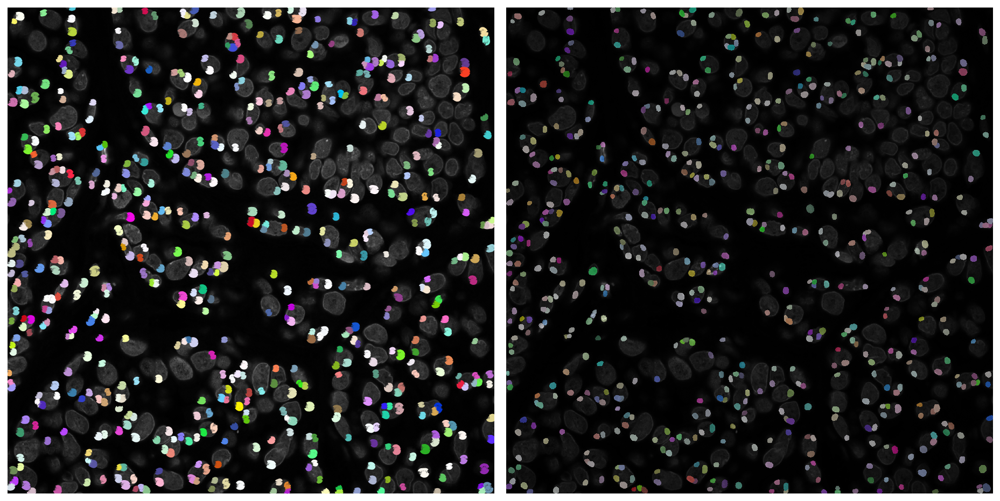

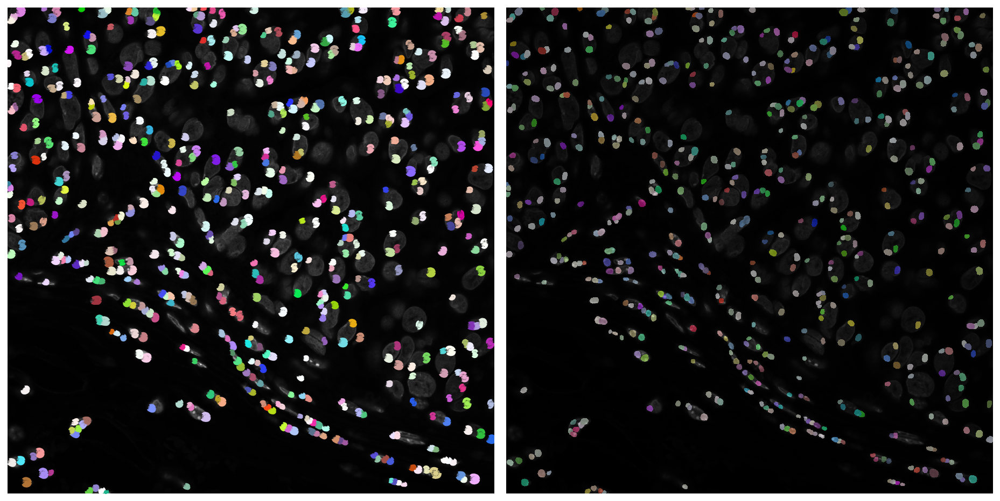

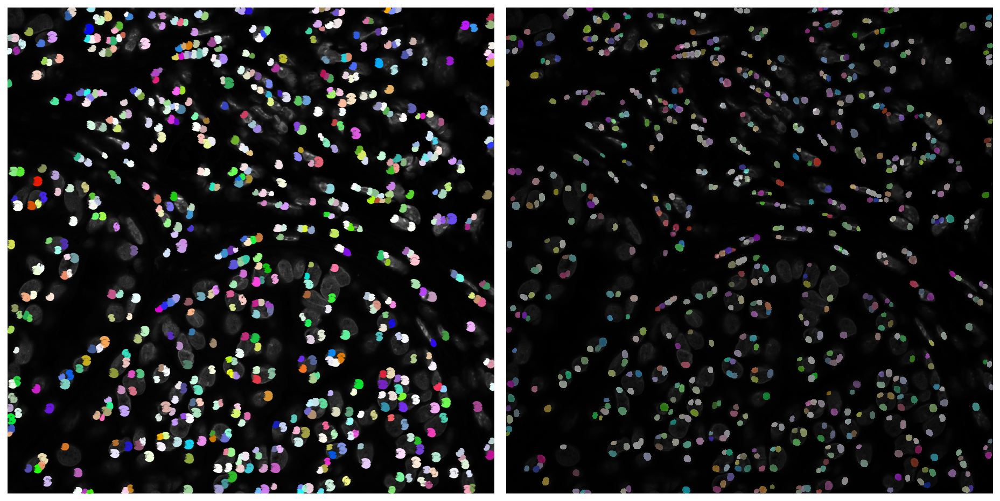

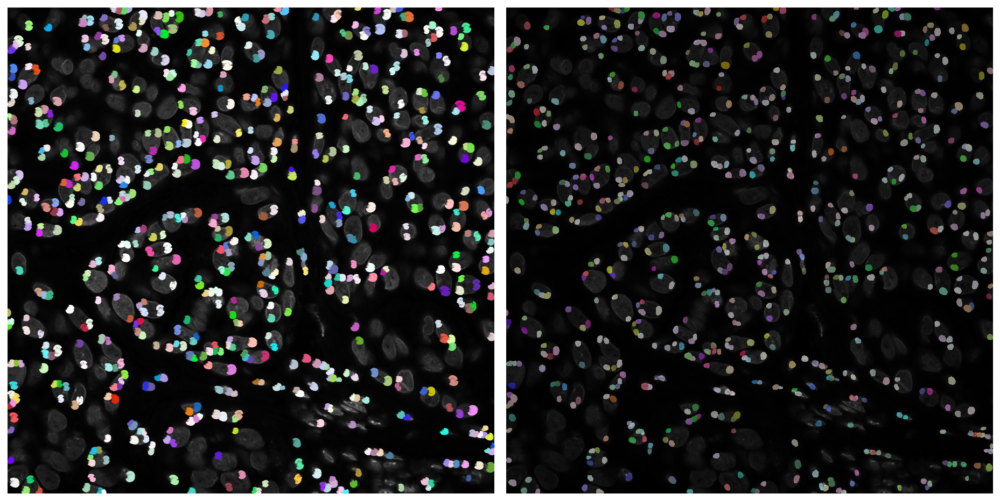

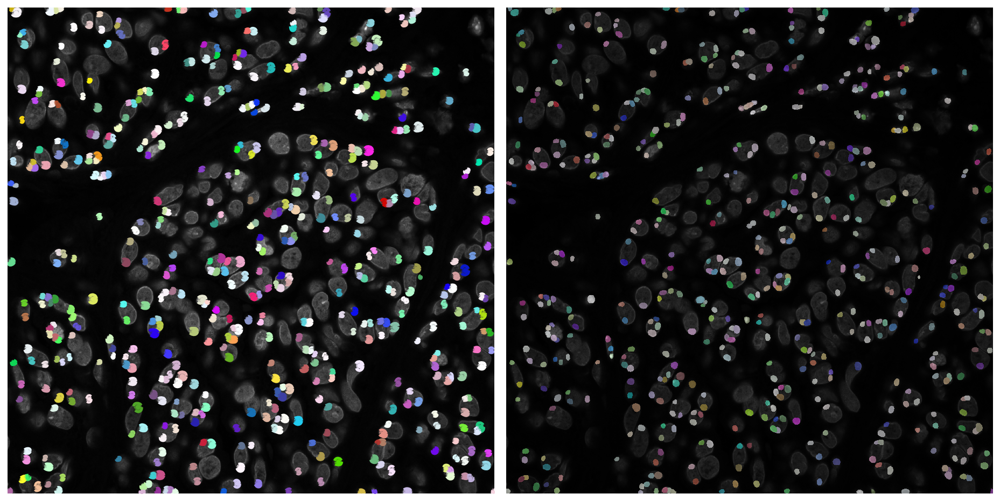

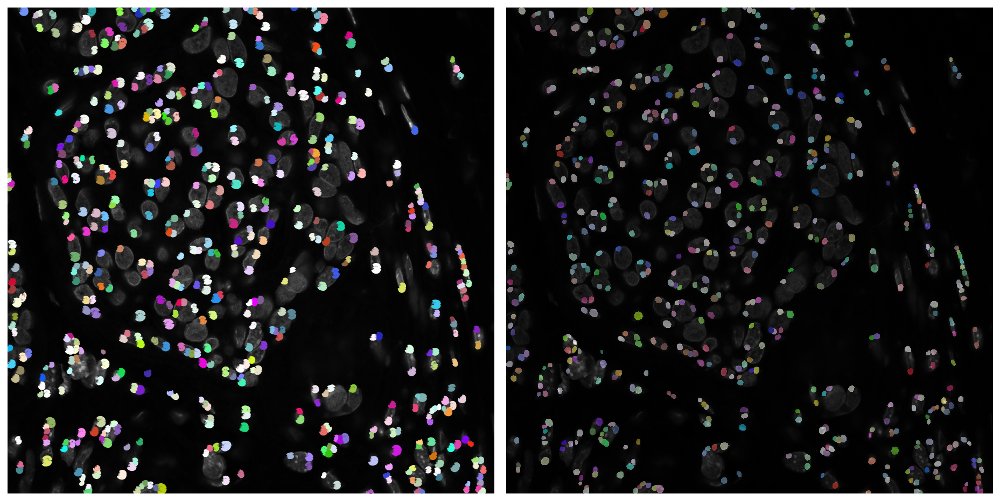

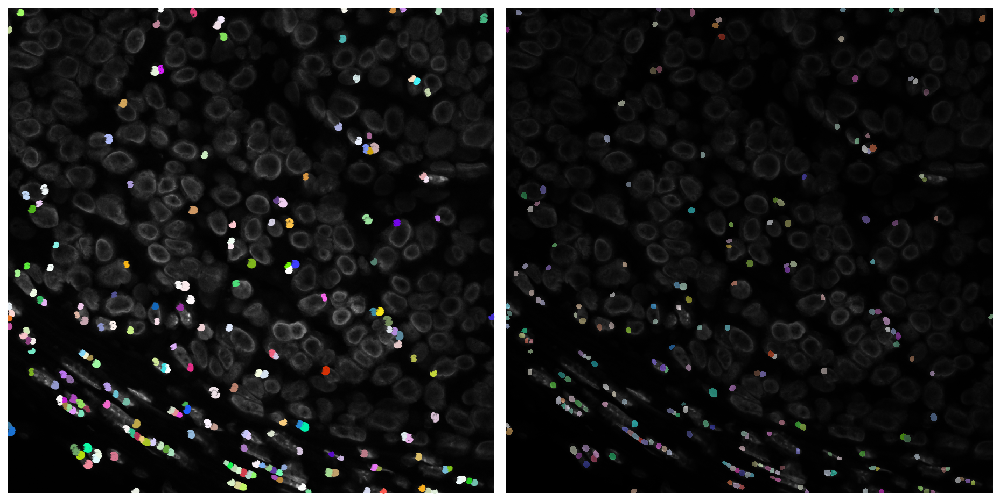

KeyboardInterrupt: ignored

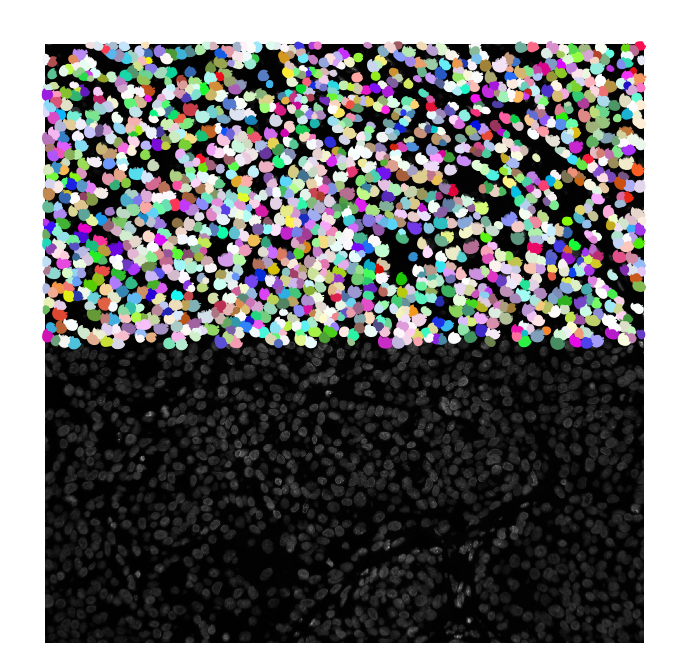

In [0]:
#@markdown Play the cell to see all the images.
# Calculates how many images is in your dataset.
my_images=len(X)

# Cell calls module "example" to show all results.
for m in range(my_images):
  example(model, m)

**8.3.2 Results (example images)**
---
**What to do:** Run the cell.

If you wish to see the different image, change like following:

Original: `example(model, 5)`

Modified: `example(model, 3)`

Number here decribes the index of results. For example, if you have 5 test images, the indexes are listed as:

image 1 = 0, image 2 = 1, image 3 = 2, image 4 = 3, image 5 = 4

**Note:** If you have only one image in your dataset, example(model, 1) shows error (do not run that cell).

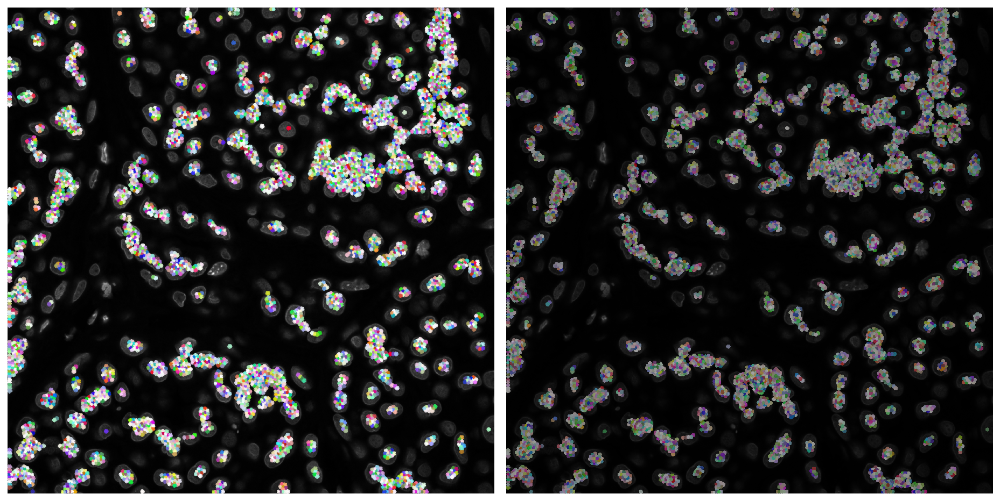

In [0]:
#@markdown Input the order number of the image you wish to see. Finally, play the cell to show your selected predicted image.
selected_image =  0#@param {type:"number"}

# Module shows the image in your dataset.
example(model, selected_image)

**8.4 Save all ROIs into results folder**
---

All ROIs are saved into your results folder. 

In [0]:
#@markdown Play the cell to save ROIs and images into results folder.
#Sorting and mapping original test dataset
X = sorted(glob(test_dataset))
X = list(map(imread,X))

# collect the names of test images
names = [os.path.basename(f) for f in sorted(glob(test_dataset))]

# modify the names to suitable form: path_images/image_numberX.tif
FILEnames=[]
for m in names:
  m=results+'/'+m
  FILEnames.append(m)

# Save all ROIs into results folder
lenght_of_X = len(X)
for i in range(lenght_of_X):
  img = normalize(X[i], 1,99.8, axis=axis_norm)
  labels, polygons = model.predict_instances(img)
  export_imagej_rois(FILEnames[i], polygons['coord'])

#polygons = [model.predict_instances(frame)[1]['coord'] for frame in tqdm(timelapse)]

**8.5 Clean your folder tree**
---
**What to do:** 

**Copy your folder tree Experiment_A1** and ALL its results elsewhere and after that clean the original folder tree (datasets, results, trained_model etc) if you plan to train or use new networks. Please note that **Section 8 does NOT analyse stack images** and throws an error. Also, notebook will **OVERWRITE** all files which have the same name.


# **9. Prediction of stack images**
---
In this section we use trained network for prediction of your stack images

![alt text](https://)**9.1 Uploading raw dataset**
---
Here we import raw images and normalize them.

In [0]:
#@markdown Play the cell to upload and normalize your raw dataset.
np.random.seed(42)
lbl_cmap = random_label_cmap()

Y = sorted(glob(test_dataset))
X = list(map(imread,Y))

n_channel = 1 if X[0].ndim == 2 else X[0].shape[-1]
axis_norm = (0,1)   # normalize channels independently
# axis_norm = (0,1,2) # normalize channels jointly
if n_channel > 1:
    print("Normalizing image channels %s." % ('jointly' if axis_norm is None or 2 in axis_norm else 'independently'))

Normalizing image channels independently.


**9.2 Importing the trained network** 
---
Here we import files containing your trained network parameters.

In [0]:
model = StarDist2D(None, name='2D_dsb2018', basedir=trained_model)

Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.486166, nms_thresh=0.5.


In [0]:
#@markdown Play the cell to import the trained network (pretrained model).
model = StarDist2D(None, name=model_name, basedir=trained_model)

Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.529906, nms_thresh=0.3.


**9.3 Convert dataset into timelapse** 
---
Here we convert your dataset into single stacks. The cell print size of stack and resolution (height x weight).

**What to do:** Run the cell.

In [0]:
#@markdown Play the cell to convert your dataset into timelapse. The cell will print the shape of the timelapse.
timelapse = np.stack(X[0])
timelapse = normalize(timelapse, 1,99.8, axis=(0,)+tuple(1+np.array(axis_norm)))
timelapse.shape

(86, 1024, 1024)

**9.4 Loop the frames**
---
Here we loop all frame in image and collect all polygon from each image.

**What to do:** Run the cell.

In [0]:
#@markdown Play the cell to loop over all frames and colled polygons.
# loop over all frames and collect polygons from each
polygons = [model.predict_instances(frame)[1]['coord'] for frame in tqdm(timelapse)]


100%|██████████| 86/86 [00:23<00:00,  3.94it/s]


**9.5 Batch processing folder of stacks** 
---
Batch process folder of stacks.

**What to do:** Run the cell.

In [0]:
#@markdown Play the cell to save ROIs and images into results folder.
# Getting the current work directory (test_batch)
names = [os.path.basename(f) for f in sorted(glob(test_dataset))]

thisdir = Path(testDATA)
outputdir = Path(results)

# Save all ROIs and images in Results folder.
for num, i in enumerate(X): 
  timelapse = np.stack(i)
  timelapse = normalize(timelapse, 1,99.8, axis=(0,)+tuple(1+np.array(axis_norm)))
  timelapse.shape
  polygons = [model.predict_instances(frame)[1]['coord'] for frame in tqdm(timelapse)]
   
  save_tiff_imagej_compatible(os.path.join(outputdir, names[num]), timelapse, axes='TYX')
  export_imagej_rois(os.path.join(outputdir, names[num]), polygons)


100%|██████████| 86/86 [00:38<00:00,  2.16it/s]

100%|██████████| 86/86 [00:37<00:00,  2.07it/s]

100%|██████████| 86/86 [00:35<00:00,  2.24it/s]

100%|██████████| 86/86 [00:36<00:00,  2.27it/s]

100%|██████████| 86/86 [00:33<00:00,  2.41it/s]

100%|██████████| 86/86 [00:33<00:00,  2.51it/s]

100%|██████████| 86/86 [00:34<00:00,  2.20it/s]


**9.6 Clean your folder tree**
---

**Copy your folder tree Experiment_A1** and ALL its results elsewhere and after that clean the original folder tree (datasets, results, trained_model etc) if you plan to train or use new networks. Please note that **Section 9 does NOT analyse single images** and throws an error. Also, notebook will **OVERWRITE** all files which have the same name.


##**Thank you for using Stardist!**